In [182]:
import pandas as pd
import numpy as np
import config
import datetime
from sqlalchemy import text
import plotly
import plotly.express as px
import ipywidgets
from urllib.request import urlopen
import json
import plotly.graph_objects as go
import geopandas as gpd
import warnings
import pyproj
import plotly.io as pio
import pickle
import math
print(config.version)
print(config.connection_string)
print(plotly.__version__, ipywidgets.__version__, pd.__version__, np.__version__)
pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore', category=UserWarning) 
pd.options.mode.copy_on_write = True


3.2.0.Dev
postgresql://postgres:sa@localhost/icip
6.3.1 8.1.7 2.0.0 1.26.4


In [2]:
# gdf = gpd.read_file("../data/iris/contours-iris.gpkg")
# gdf = gdf.to_crs(epsg=4326)
# gdf["fid"] = gdf.index
# gdf["lon"] = gdf.geometry.centroid.x
# gdf["lat"] = gdf.geometry.centroid.y
# gdf = gdf.sort_values(by="code_iris")
# with open("../data/iris/gdf.pickle", "wb") as f:
#     pickle.dump(gdf, f)
with open("../data/iris/gdf.pickle", "rb") as f:
    gdf_france = pickle.load(f)
    geojson=gdf_france.__geo_interface__
    print(len(gdf_france))

48569


In [69]:
bor_dico = {"urgence_gen": "Urgences générales", "urgence_ped": "Urgences prédiatriques", "psy": "Etablissements psychiatriques", "pharma": "Pharmacies", "ehpad": "EHPAD"}

Documentation

code_commune: il y a plusieurs possibilités :
* le code de la commune sur 5 chiffres, par exemple "06088" pour Nice
* certains anciens code commune sont acceptés comme 75101 pour Paris 1er arrondissement
* le département sur 2 chiffres, par exemple "06"
* le code IRIS sur 9 chiffres, par exemple "382050000"
* une liste de code IRIS entre crochet, par exemple \["385480000", "382050000"]
* une liste de code commune entre crochet, par exemple \["38548", "38205"]
* le code IRIS avec un joker sql de type "3820%"
* pour la corse utiliser les préfixes 2A ou 2B et non 20, par exemple "2A004"

bor: voir tableau ci dessus

time: 30 ou 45, il est possible d'en faire d'autre mais il faut lancer les calculs

time_type: "HC" ou "HP"

aexp: -0.12 ou -0.1 ou -0.08 ou -0.06 ou -0.04<br>
Pour time==30 aexp: -0.12 ou -0.1 ou -0.08<br>
Pour time==45 aexp: -0.08 ou -0.06<br>
Pour time==60 aexp: -0.06 ou -0.04

norm_colorbar = True si normalisé sur France entière False sinon

meanw_colorbar = True si normalisé sur moyenne pondérée, False si normalisé sur Médiane

Pour ne plus voir les labels sur les IRIS mettre limit_show=0

Puis appuyer sur le bouton Restart (bouton avec double flèche à droite FFW) ou dans le menu Run / Run selected cell and all below

In [200]:
code_commune="06088" #"75101" #"75056" #"69123" #"38185"  #"06088" "38205" "38548" "2A004" "382050000" ["385480000", "382050000"] ["38548", "38205"] "45" "14581" bug
bor = "urgence_gen"
time=60
time_type="HC" # HC or HP
norm_colorbar=False
meanw_colorbar=True
years = list(range(13 if bor not in ["pharma", "ehpad"] else 4,25))
code_commune,bor,time,time_type,norm_colorbar,meanw_colorbar

('06088', 'ugence_gen', 60, 'HC', False, True)

In [201]:
if bor not in bor_dico:
    raise ValueError(f"Bad bor value: {bor}")
if type(code_commune) is list:
    if len(code_commune[0])==5:
        type_code="CLIST"
    elif  len(code_commune[0])==9:
        type_code = "ILIST"
    else:
        raise ValueError(f"Bad {code_commune}")    
elif "%" in code_commune and len(code_commune) > 2:
    type_code = "LIKE"
elif len(code_commune) == 2:
    type_code = "LIKE"
    code_commune = code_commune + "%"
elif len(code_commune) == 5:
    type_code = "COM"
elif len(code_commune) == 9:
    type_code = "IRIS"
else:
    raise ValueError(f"Bad {code_commune}")
print(f"Type code: {type_code}")

ValueError: Bad bor value

In [185]:
sql = f"""
select i.*, c.nom commune_nom from iris.commune c
join iris.iris i on i.commune_id=c.id
where c.code='{code_commune}'
order by i.id
"""
commune_nom = None
if type_code=="COM":
    iris_df = pd.read_sql(sql, config.connection_string)
    iriss = iris_df["code"].values
    commune_nom = iris_df["commune_nom"].iloc[0] if len(iris_df) > 0 else None
elif type_code in ["IRIS", "LIKE"]:
    iriss = [code_commune]
elif type_code == "ILIST":
    iriss = code_commune
elif type_code == "CLIST":
    sql = f"""
select i.*, c.nom commune_nom from iris.commune c
join iris.iris i on i.commune_id=c.id
where c.code in {tuple(code_commune)}
"""
    print(sql)
    iris_df = pd.read_sql(sql, config.connection_string)
    iriss = iris_df["code"].values
    commune_nom = iris_df["commune_nom"].iloc[0] if len(iris_df) > 0 else None
print(f"Found {len(iriss)} iris for {commune_nom}")

if type_code == "LIKE":
    gdf = gdf_france[gdf_france["code_iris"].str.startswith(code_commune[:-1])]
elif len(iriss)>0:
    gdf = gdf_france[gdf_france["code_iris"].isin(iriss)]
else:
    gdf = gdf_france[gdf_france["code_insee"]==code_commune]
    type_code="INSEE"
if commune_nom is None:
    commune_nom=gdf["nom_commune"].iloc[0] if len(gdf) > 0 else None
    print(f"Found {len(gdf)} iris in {commune_nom}")
geojson=gdf.__geo_interface__
print(f"Found {len(gdf)} geo iris for {commune_nom}, type_code: {type_code}")
# gdf_france[gdf_france["nom_commune"].str.startswith("Lyon")].head(100)
gdf.head(2)

Found 146 iris for Nice
Found 146 geo iris for Nice, type_code: COM


,cleabs,code_insee,nom_commune,iris,code_iris,nom_iris,type_iris,geometry,fid,lon,lat
2597,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476
4458,IRIS____0000000060880102,06088,Nice,0102,060880102,Vieux Nice-Sainte-Réparate,H,"MULTIPOLYGON (((7.27454 43.69773, 7.27598 43.6...",4458,7.275641,43.697293


In [186]:
def get_study_by_year(year):
    sql = f"""
    select * from sae.dist_study s
    where s.bor='{bor}'
    and s.year=20{year:02d}
    and s.time={time}
    and s.time_type='{time_type}'
    order by date desc
    limit 1
    """
    return pd.read_sql(sql, config.connection_string)

def get_studies_by_years(years: list[int]):
    df = None
    for year in years:
        if df is None:
            df = get_study_by_year(year)
        else:
            df = pd.concat([df, get_study_by_year(year)], ignore_index=True)
    return df
        
        
    
studies_df = get_studies_by_years(years)
studies_df

,year,bor,time,time_type,meanw,mean,std,q10,q25,q50,q75,q90,min,max,passu_mean,etpsal_mean,efflib_mean,etp_mean,tension_mean,date,key
0,2013,urgence_gen,60,HC,69.646116,78.332928,28.485674,10.0,90.0,90.0,90.0,90.0,0.0,90.0,31652.501431,0.0,0.0,10.182641,4378.81022,2025-12-13 13:20:18.673778,95767008415
1,2014,urgence_gen,60,HC,69.832806,78.440796,28.374079,10.0,90.0,90.0,90.0,90.0,0.0,90.0,33071.926076,0.0,0.0,10.314495,4091.714716,2025-12-13 13:20:23.413589,857672923762
2,2015,urgence_gen,60,HC,69.811788,78.436122,28.378466,10.0,90.0,90.0,90.0,90.0,0.0,90.0,34297.480589,0.0,0.0,11.123145,3836.860504,2025-12-13 13:20:28.279387,811781741234
3,2016,urgence_gen,60,HC,70.072909,78.575120,28.234849,10.0,90.0,90.0,90.0,90.0,0.0,90.0,36100.081101,0.0,0.0,11.136459,3934.554765,2025-12-13 13:20:33.152149,20930911701
4,2017,urgence_gen,60,HC,69.949099,78.532418,28.280175,10.0,90.0,90.0,90.0,90.0,0.0,90.0,37387.792445,0.0,0.0,11.641592,3808.721036,2025-12-13 13:20:38.117649,204936152654
5,2018,urgence_gen,60,HC,69.902807,78.531368,28.280278,10.0,90.0,90.0,90.0,90.0,0.0,90.0,38465.136059,0.0,0.0,11.568878,4014.728356,2025-12-13 13:20:42.925247,807673419230
6,2019,urgence_gen,60,HC,69.988399,78.600795,28.204822,10.0,90.0,90.0,90.0,90.0,0.0,90.0,39329.296307,0.0,0.0,12.082612,4096.058949,2025-12-13 13:20:47.771777,670960364025
7,2020,urgence_gen,60,HC,70.070349,78.650580,28.151125,10.0,90.0,90.0,90.0,90.0,0.0,90.0,33106.430380,0.0,0.0,12.330277,3262.542365,2025-12-13 13:20:52.678195,554373858584
8,2021,urgence_gen,60,HC,70.022162,78.628096,28.175571,10.0,90.0,90.0,90.0,90.0,0.0,90.0,35864.780516,0.0,0.0,12.581548,3752.338003,2025-12-13 13:20:57.596287,122603909681
9,2022,urgence_gen,60,HC,69.956583,78.611851,28.191683,10.0,90.0,90.0,90.0,90.0,0.0,90.0,38057.858922,None,None,None,None,2025-12-13 13:21:02.877989,348471982704


In [187]:
keys = studies_df["key"].values
print(f"Studies keys: {keys}")
if type_code == "COM":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and code_commune='{code_commune}'
    """
elif type_code == "IRIS":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and a.iris_string='{code_commune}'
    """
elif type_code == "LIKE":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and a.iris_string like '{code_commune}'
    """
elif type_code == "ILIST":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and a.iris_string in {tuple(code_commune)}
    """
elif type_code == "CLIST":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and a.code_commune in {tuple(code_commune)}
    """
print(sql)
apl = pd.read_sql(text(sql), config.connection_string)
if type_code == "INSEE" or len(apl) == 0:
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    """
    apl = pd.read_sql(sql, config.connection_string)
apl

Studies keys: [ 95767008415 857672923762 811781741234  20930911701 204936152654
 807673419230 670960364025 554373858584 122603909681 348471982704
  27992506418 536450741496]

    select * from sae.dist a
    where a.study_key in (95767008415, 857672923762, 811781741234, 20930911701, 204936152654, 807673419230, 670960364025, 554373858584, 122603909681, 348471982704, 27992506418, 536450741496)
    and code_commune='06088'
    


,km,time_hc,time_hp,fi,passu,has_pdata,etpsal,efflib,etp,rs,lon,lat,tension,iris,iris_label,code_commune,commune_label,pop,iris_string,meanw,year,study_key
0,7.0,12.0,17.0,060780715,26279.0,True,0.0,0.0,7.5,CLINIQUE SAINT GEORGE,7.277891,43.733607,3503.866667,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,11.391724,2016,20930911701
1,NaN,NaN,NaN,None,0.0,None,0.0,0.0,0.0,None,NaN,NaN,NaN,60880301,République,06088,Nice,2183.527260,060880301,147.880918,2014,857672923762
2,7.0,12.0,17.0,060780715,28090.0,True,0.0,0.0,8.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,3511.250000,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,11.391724,2014,857672923762
3,6.0,10.0,15.0,060780715,28090.0,True,0.0,0.0,8.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,3511.250000,60880102,Vieux Nice-Sainte-Réparate,06088,Nice,1215.033917,060880102,9.143225,2014,857672923762
4,8.0,13.0,19.0,060780715,28090.0,True,0.0,0.0,8.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,3511.250000,60880103,Vieux Nice-Visitation,06088,Nice,2005.072251,060880103,19.614823,2014,857672923762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1747,8.0,12.0,17.0,060780723,14896.0,False,0.0,0.0,0.0,CLINIQUE DU PARC IMPERIAL,7.251959,43.702827,inf,60883501,Crémat-Bellet,06088,Nice,2649.665320,060883501,23.585664,2024,536450741496
1748,NaN,NaN,NaN,None,0.0,None,0.0,0.0,0.0,None,NaN,NaN,NaN,60883601,Saint-Pierre de Féric,06088,Nice,2930.552478,060883601,195.644596,2024,536450741496
1749,NaN,NaN,NaN,None,0.0,None,0.0,0.0,0.0,None,NaN,NaN,NaN,60883602,Costière,06088,Nice,2200.226082,060883602,146.887779,2024,536450741496
1750,NaN,NaN,NaN,None,0.0,None,0.0,0.0,0.0,None,NaN,NaN,NaN,60883701,Saint-Pancrace-Pessicart,06088,Nice,3188.198432,060883701,212.845120,2024,536450741496


In [188]:
if len(apl[apl["iris_string"]=="140110000"])>0:
    apl.loc[apl["iris_string"]=="140110000","iris_string"]="145810000"

In [189]:
def get_urgence_sae(iris_list, urg="GEN"):
    sql = f"""
select d.an as year, d.fi, d.passu, p.perso is not null has_pdata, p.etpsal, p.efflib, p.etp, e.id etab_id, e.rs, an.dept_id, an.id adresse_norm_id, an.lon, an.lat, i.id iris 
from sae.urgence_detail d
left join sae.urgence_p p on p.fi=d.fi and p.an=d.an and p.perso='M9999'
join etablissement e on e.nofinesset=d.fi
join adresse_raw ar on e.adresse_raw_id=ar.id
join adresse_norm an on ar.adresse_norm_id=an.id
join iris.iris i on i.code=an.iris
where d.urg='{urg}'
and an.iris in {tuple(iris_list)}
order by d.an, d.fi
"""
    # TODO bug si len(tuple)==1 : {tuple(commune_list) if len(commune_list)>1 else "("+ commune_list+")"}
    print(f"Quering SAE urgence for {urg}")
    # print(sql)
    return pd.read_sql(sql, config.connection_string)

def get_psy_sae(iris_list):
    sql = f"""
select p.an as year, p.fi, p.cap_htp passu, true has_pdata, p.etpsal_pkt etpsal, p.efflib_pkt efflib, p.etp_pkt etp, e.id etab_id, e.rs, an.dept_id, an.id adresse_norm_id, an.lon, an.lat, i.id iris 
from sae.psy p
join etablissement e on e.nofinesset=p.fi
join adresse_raw ar on e.adresse_raw_id=ar.id
join adresse_norm an on ar.adresse_norm_id=an.id
join iris.iris i on i.code=an.iris
where p.dis='TOT'
and an.iris in {tuple(iris_list)}
order by p.an, p.fi
"""
    print(f"Quering SAE psy")
    # print(sql)
    return pd.read_sql(sql, config.connection_string)

def get_pharma(iris_list):
    sql = f"""
select ds.annee+2000 as year, e.nofinesset fi, null as passu, false as has_pdata, null as etpsal, null as efflib, null as etp, e.id etab_id, e.rs, an.id an_id, an.dept_id, an.id adresse_norm_id, an.lon, an.lat, i.id iris
from etablissement e
join etablissement_date_source eds on eds.etablissement_id=e.id
join adresse_raw ar on ar.id=e.adresse_raw_id
join adresse_norm an on an.id=ar.adresse_norm_id
join iris.iris i on i.code=an.iris
join date_source ds on eds.date_source_id=ds.id
where e.categetab=620
and an.iris in {tuple(iris_list)}
order by ds.annee, e.nofinesset
    """
    print(f"Quering etablissement pharma")
    # print(sql)
    return pd.read_sql(sql, config.connection_string)

def get_ehpad(iris_list):
    sql = f"""
select ds.annee+2000 as year, e.nofinesset fi, null as passu, false as has_pdata, null as etpsal, null as efflib, null as etp, e.id etab_id, e.rs, an.id an_id, an.dept_id, an.id adresse_norm_id, an.lon, an.lat, i.id iris
from etablissement e
join etablissement_date_source eds on eds.etablissement_id=e.id
join adresse_raw ar on ar.id=e.adresse_raw_id
join adresse_norm an on an.id=ar.adresse_norm_id
join iris.iris i on i.code=an.iris
join date_source ds on eds.date_source_id=ds.id
where e.categretab=4401
and an.iris in {tuple(iris_list)}
order by ds.annee, e.nofinesset
    """
    print(f"Quering etablissement ehpad")
    # print(sql)
    return pd.read_sql(sql, config.connection_string)


def get_sae_by_bor(bor, iris_list):
    if bor == "urgence_gen":
        return get_urgence_sae(iris_list, "GEN")
    elif bor == "urgence_ped":
        return get_urgence_sae(iris_list, "PED")
    elif bor == "psy":
        return get_psy_sae(iris_list)
    elif bor == "pharma":
        return get_pharma(iris_list)
    elif bor == "ehpad":
        return get_ehpad(iris_list)
        

iris_list = list(gdf["code_iris"].unique())
etab_df = get_sae_by_bor(bor, iris_list)
etab_df

Quering SAE urgence for GEN


,year,fi,passu,has_pdata,etpsal,efflib,etp,etab_id,rs,dept_id,adresse_norm_id,lon,lat,iris
0,2013,060001450,78711,True,NaN,NaN,23.33,131791,HOPITAL SAINT ROCH,6,106123,7.274071,43.702960,60881702
1,2013,060001450,78711,True,NaN,NaN,23.33,131791,HOPITAL SAINT ROCH,6,106123,7.274071,43.702960,60881702
2,2013,060780715,27852,True,NaN,NaN,8.00,133080,CLINIQUE SAINT GEORGE,6,2852,7.277891,43.733607,60883801
3,2013,060780715,27852,True,NaN,NaN,8.00,133080,CLINIQUE SAINT GEORGE,6,2852,7.277891,43.733607,60883801
4,2013,060780723,15737,True,NaN,NaN,0.21,133044,CLINIQUE DU PARC IMPERIAL,6,77500,7.251959,43.702827,60881902
5,2013,060780723,15737,True,NaN,NaN,0.21,133044,CLINIQUE DU PARC IMPERIAL,6,77500,7.251959,43.702827,60881902
6,2014,060001450,78780,True,NaN,NaN,19.73,131791,HOPITAL SAINT ROCH,6,106123,7.274071,43.702960,60881702
7,2014,060001450,78780,True,NaN,NaN,19.73,131791,HOPITAL SAINT ROCH,6,106123,7.274071,43.702960,60881702
8,2014,060780715,28090,True,NaN,NaN,8.00,133080,CLINIQUE SAINT GEORGE,6,2852,7.277891,43.733607,60883801
9,2014,060780715,28090,True,NaN,NaN,8.00,133080,CLINIQUE SAINT GEORGE,6,2852,7.277891,43.733607,60883801


In [190]:
etab_df2 = etab_df.drop_duplicates(subset=['year', "lon", "lat"])
etab_df2["tension"] = etab_df2["passu"]/etab_df2["etp"]
etab_df2["has_pdata"] = etab_df2["tension"].notna() 
etab_df2

,year,fi,passu,has_pdata,etpsal,efflib,etp,etab_id,rs,dept_id,adresse_norm_id,lon,lat,iris,tension
0,2013,060001450,78711,True,NaN,NaN,23.33,131791,HOPITAL SAINT ROCH,6,106123,7.274071,43.702960,60881702,3373.810544
2,2013,060780715,27852,True,NaN,NaN,8.00,133080,CLINIQUE SAINT GEORGE,6,2852,7.277891,43.733607,60883801,3481.500000
4,2013,060780723,15737,True,NaN,NaN,0.21,133044,CLINIQUE DU PARC IMPERIAL,6,77500,7.251959,43.702827,60881902,74938.095238
6,2014,060001450,78780,True,NaN,NaN,19.73,131791,HOPITAL SAINT ROCH,6,106123,7.274071,43.702960,60881702,3992.904207
8,2014,060780715,28090,True,NaN,NaN,8.00,133080,CLINIQUE SAINT GEORGE,6,2852,7.277891,43.733607,60883801,3511.250000
10,2014,060780723,15787,True,NaN,NaN,0.21,133044,CLINIQUE DU PARC IMPERIAL,6,77500,7.251959,43.702827,60881902,75176.190476
12,2015,060001450,39970,True,NaN,NaN,11.85,131791,HOPITAL SAINT ROCH,6,106123,7.274071,43.702960,60881702,3372.995781
14,2015,060780715,27340,True,NaN,NaN,8.00,133080,CLINIQUE SAINT GEORGE,6,2852,7.277891,43.733607,60883801,3417.500000
16,2015,060780723,13693,True,NaN,NaN,4.80,133044,CLINIQUE DU PARC IMPERIAL,6,77500,7.251959,43.702827,60881902,2852.708333
18,2016,060780715,26279,True,NaN,NaN,7.50,133080,CLINIQUE SAINT GEORGE,6,2852,7.277891,43.733607,60883801,3503.866667


In [191]:
# etab = apl[apl["km"]==0].drop_duplicates(subset=['year', "lon", "lat"])
# etab = etab[["year","fi","rs","passu","has_pdata","etpsal","efflib","etp","tension","lon","lat"]]
# etab = etab.dropna(subset=["lon"])
# etab
etab = etab_df2[["year","fi","rs","passu","has_pdata","etpsal","efflib","etp","tension","lon","lat"]]

In [192]:
apl["code_iris"]=apl["iris_string"]
gdf_merged = gdf.merge(apl, on="code_iris", how="left", suffixes=('', '_dest')).copy()
# gdf_merged["pretty"]=gdf_merged["time_hc"].fillna(0).apply(lambda x: round(x, 0)).astype(np.int32)
apl13 = gdf_merged.loc[gdf_merged['year']==2013, ['iris_dest', 'time_hc']].set_index('iris_dest')['time_hc']
gdf_merged["year13"]=gdf_merged['iris_dest'].map(apl13)
gdf_merged["diff13"]=gdf_merged["time_hc"]-gdf_merged["year13"]
gdf_merged["delta13"]=gdf_merged["diff13"]/(gdf_merged["year13"]+1e-5)
gdf_merged

,cleabs,code_insee,nom_commune,iris,code_iris,nom_iris,type_iris,geometry,fid,lon,lat,km,time_hc,time_hp,fi,passu,has_pdata,etpsal,efflib,etp,rs,lon_dest,lat_dest,tension,iris_dest,iris_label,code_commune,commune_label,pop,iris_string,meanw,year,study_key,year13,diff13,delta13
0,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,7.0,12.0,17.0,060780715,26279.0,True,0.0,0.0,7.5,CLINIQUE SAINT GEORGE,7.277891,43.733607,3503.866667,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,11.391724,2016,20930911701,12.0,0.0,0.0
1,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,7.0,12.0,17.0,060780715,28090.0,True,0.0,0.0,8.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,3511.250000,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,11.391724,2014,857672923762,12.0,0.0,0.0
2,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,7.0,12.0,17.0,060780715,27852.0,True,0.0,0.0,8.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,3481.500000,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,11.391724,2013,95767008415,12.0,0.0,0.0
3,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,7.0,12.0,17.0,060780715,27340.0,True,0.0,0.0,8.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,3417.500000,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,11.391724,2015,811781741234,12.0,0.0,0.0
4,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,7.0,12.0,17.0,060780715,26460.0,True,0.0,0.0,8.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,3307.500000,60880101,Saleya-Château,06088,Nice,1318.103754,060880101,11.813413,2019,670960364025,12.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1747,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,0.0,0.0,0.0,060780715,24577.0,True,0.0,0.0,8.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,3072.125000,60883801,Gairaut,06088,Nice,2632.933842,060883801,0.000000,2020,554373858584,0.0,0.0,0.0
1748,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,0.0,0.0,0.0,060780715,29043.0,True,0.0,13.0,0.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,inf,60883801,Gairaut,06088,Nice,2685.623135,060883801,0.000000,2023,27992506418,0.0,0.0,0.0
1749,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,0.0,0.0,0.0,060780715,37038.0,True,0.0,0.0,8.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,4629.750000,60883801,Gairaut,06088,Nice,2685.623135,060883801,0.000000,2021,122603909681,0.0,0.0,0.0
1750,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,0.0,0.0,0.0,060780715,28469.0,False,0.0,0.0,0.0,CLINIQUE SAINT GEORGE,7.277891,43.733607,inf,60883801,Gairaut,06088,Nice,2685.623135,060883801,0.000000,2022,348471982704,0.0,0.0,0.0


In [193]:
q10 = studies_df[studies_df["year"]==2013]["q10"].iloc[0]
q25 = studies_df[studies_df["year"]==2013]["q25"].iloc[0]
q50 = studies_df[studies_df["year"]==2013]["q50"].iloc[0]
q75 = studies_df[studies_df["year"]==2013]["q75"].iloc[0]
q90 = studies_df[studies_df["year"]==2013]["q90"].iloc[0]
qmax = 60 if bor not in ["pharma", "ehpad"] else 30
if bor=="pharma":
    q10 += 1
    q25 += 2
elif bor=="ehpad":
    q10 += 1
q10,q25,q50,q75,q90,qmax

(10.0, 90.0, 90.0, 90.0, 90.0, 60)

In [194]:
if bor in ["pharma", "ehpad"]:
    etab = etab[etab['year'] != 2018]
    rows_2017 = etab[etab['year'] == 2017].copy()
    rows_2018 = rows_2017.assign(year=2018)
    etab = pd.concat([etab, rows_2018], ignore_index=True)
    gdf_merged = gdf_merged[gdf_merged['year'] != 2018]
    rows_2017 = gdf_merged[gdf_merged['year'] == 2017].copy()
    rows_2018 = rows_2017.assign(year=2018)
    gdf_merged = pd.concat([gdf_merged, rows_2018], ignore_index=True)
    gdf_merged[gdf_merged["year"]==2018]

In [195]:
etab[etab["year"]==2004]

,year,fi,rs,passu,has_pdata,etpsal,efflib,etp,tension,lon,lat


13
14
15
16
17
18
19
20
21
22
23
24


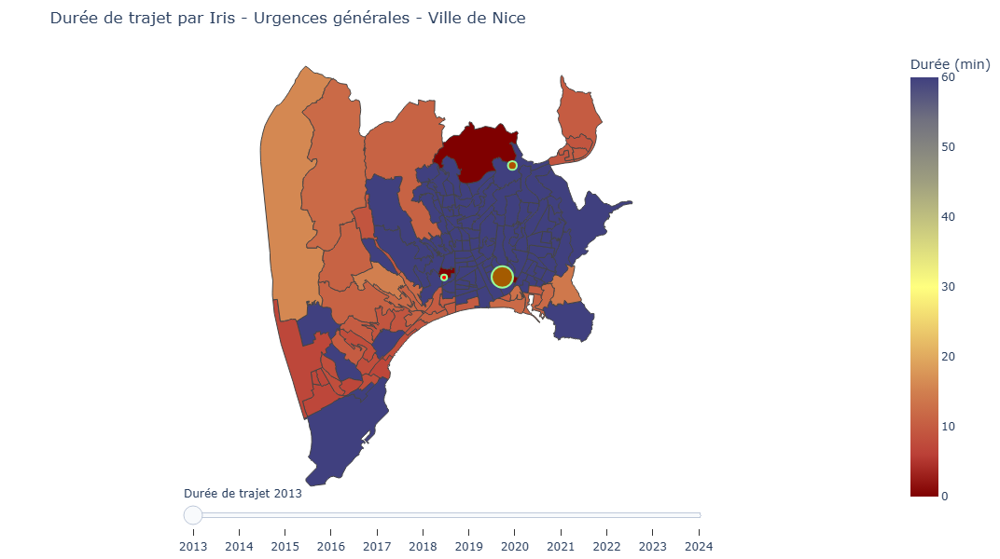

In [196]:
show_label=True
fig = go.Figure()
l=[]
l2=[]
center_lat = gdf.geometry.centroid.y.mean()
center_lon = gdf.geometry.centroid.x.mean()
passage_dico = {"urgence_gen": "passage", "urgence_ped": "passage", "psy": "lit", "pharma": "passage", "ehpad": "lit"}
size_dico = {"urgence_gen": 8/30000, "urgence_ped": 8/30000, "psy": 6/100, "pharma": 1, "ehpad": 1}
for year in years:
    print(year)
    gdf_year=gdf_merged[gdf_merged["year"]==year+2000]
    l.append(
        go.Choropleth(
            visible=False,
            geojson=geojson,
            locations=gdf_year["fid"],
            z=gdf_year["time_hc"].fillna(60),
            zmin=0,
            zmax=qmax,
            text=gdf_year.apply(
                lambda row: f"""
Commune: {row["nom_commune"]}<br>
Iris: {row["code_iris"]}<br>
Nom Iris: {row['nom_iris']}<br>
Etablissement le plus proche: {"Aucun" if row["rs"] is None else row["rs"].capitalize()} <br>
Temps d'accès: {">60" if np.isnan(row["time_hc"]) else int(row["time_hc"])} min<br>
Temps d'accès heure pleine: {">60" if np.isnan(row["time_hp"]) else int(row["time_hp"])} min<br>
Distance: {"NA" if np.isnan(row["km"]) else int(row["km"])} km<br>
Variation / 2013: {"NA" if np.isnan(row["delta13"]) else int(row["delta13"]*100)}%<br>
Population: {row['pop']:.0f}<br>""",
                axis=1
            ),
            hoverinfo="text",
            showscale=True,
            colorbar={"title": f"Durée (min)"},
            colorscale=[[0.0, "rgb(127,0,0)"],
                        [q10/qmax if norm_colorbar else 0.1, "rgb(187,64,55)"],
                        [q25/qmax if norm_colorbar else 0.25, "rgb(209,127,79)"],
                        [q50/qmax if norm_colorbar else 0.5, "rgb(255,255,127)"],
                        [q75/qmax if norm_colorbar else 0.75, "rgb(159,159,127)"],
                        [q90/qmax if norm_colorbar else 0.9, "rgb(112,112,127)"],
                        [1.0, "rgb(64,64,127)"]
                       ]
        ))
    if show_label:
        etab_year=etab[etab["year"]==year+2000]
        if bor in ["urgence_gen", "urgence_ped"]:
            colors = etab_year.apply(lambda row: 
f"rgb({127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255)},{255 - (127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255))},0)"
                , axis=1)
        else:
            colors = etab_year.apply(lambda row: 
f"rgb({127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-11)*10+127.5),0,255)},{255 - (127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255))},0)"                                              
                , axis=1)
        l2.append(
            go.Scattergeo(
                lon=etab_year["lon"],
                lat=etab_year["lat"],
                text=etab_year.apply(lambda row: f"""
{row["rs"]}<br>
N° Finess: {row["fi"]}<br>
Nb {passage_dico[bor]} 20{year:02d}: {"NA" if row["passu"] is None or math.isnan(row["passu"]) else int(row["passu"])}<br>
ETP: {"NA" if not(row["has_pdata"]) else np.round(row["etp"],1)}<br>
Dont salarié: {"NA" if not(row["has_pdata"]) else np.round(row["etpsal"],1)}<br>
Dont libéraux: {"NA" if not(row["has_pdata"]) else np.round(row["efflib"],1)}<br>
Tension: {"NA" if not(row["has_pdata"]) or row["tension"]==np.inf else int(row["tension"])} {passage_dico[bor]}/ETP<br>
GPS: {row["lat"]},{row["lon"]}<br>
Color: rgb({127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255)},{255 - (127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255))},0)
""", axis=1),
                hoverinfo="text",
                showlegend=False,
                visible=False,
                marker=dict(
                        color=colors,
                        size=(etab_year["passu"].fillna(0))*size_dico[bor]+2,
                        opacity=1,
                        line=dict(
                            color='#99ff99',
                            width=2
                        ),
                    ),
            ))
fig = go.Figure(data=l+l2)
i_visible = 0
fig.data[i_visible].visible = True
if show_label:
    fig.data[len(l)+i_visible].visible = True
steps = []
i=0
for year in years:
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
             ],
        label=f"20{year:02d}",
    )
    step["args"][0]["visible"][i] = True
    if show_label:
        step["args"][0]["visible"][i+len(l)] = True
    steps.append(step)
    i+=1

sliders = [dict(
    active=0,
    currentvalue={"prefix": "Durée de trajet ", "visible":True},
    steps=steps,
    pad=dict(l=0, r=0, t=0, b=10),
    len=0.6,
    x=0.2,
    y=0.05,
)]

fig.update_layout(
    sliders=sliders,
    geo=dict(
        projection_type="mercator",
        center={"lat": center_lat, "lon": center_lon},
        fitbounds="locations",
        showland=False,
        showcountries=False,
        showocean=False,
        showlakes=False,
        showrivers=False,
        visible=False,
    ),
    title=f"Durée de trajet par Iris - {bor_dico[bor]} - {"Ville de" if len(code_commune) != 3 else "Département"} {commune_nom if len(code_commune) != 3 else code_commune[:-1]}",
    height=600,
    # width=2000,  
    autosize=False,
    margin=dict(l=10, r=0, t=50, b=10),
)

fig.show()

In [197]:
gdf_merged["time_hc"].describe().apply("{0:.0f}".format)

count    477
mean      10
std        3
min        0
25%        8
50%       10
75%       12
max       17
Name: time_hc, dtype: object

In [198]:
fig.update_layout(
    height=None,
    width=None, 
    autosize=True,
    # margin=dict(l=10, r=0, t=50, b=50)
)
pio.write_html(fig, file=f"out/sae_dist_{bor}_{code_commune.replace("%","")}.html", auto_open=True, include_plotlyjs="cdn", full_html=True, config={"responsive": True})